In [1]:
%load_ext autoreload
%autoreload 2

In [9]:
import torch
from PIL import Image
from instructany2pix import InstructAny2PixPipeline
import IPython


In [3]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [4]:

pipe = InstructAny2PixPipeline(llm_folder='llm-retrained')
#pipe.pipe.scheduler = pipe.pipe_inversion.scheduler

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
You are using a model of type llava to instantiate a model of type instructany2pix. This is not supported for all configurations of models and can yield errors.


pre_init


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

/home/jacklishufan/miniconda3/envs/llava/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


In [7]:
cas = "assets/demo/rains_of_castamere.wav"
naruto = "assets/demo/naruto.wav"

In [8]:
x = {"inst": "Please tag the music <video>",
 "ans": "an image of an antique shop with a clock ticking",
 "mm_data": [{"type": "audio"}]
}


In [11]:
IPython.display.Audio(cas)

In [12]:
IPython.display.Audio(naruto)

# Sanity Check for Music Understanding

In [14]:
torch.manual_seed(1)
inst = x['inst']
mm_data = x['mm_data']
mm_data[0]['fname']=naruto
use_cache = 0
res0,res,output_caption = pipe(inst,mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=True,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa',subject_strength=0.0,cfg=5)
print(output_caption)
res0,res,output_caption = pipe("Please describe the music <video>",mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=True,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa',subject_strength=0.0,cfg=5)
print(output_caption)
inst = x['inst']
mm_data = x['mm_data']
mm_data[0]['fname']=cas
use_cache = 0
res0,res,output_caption = pipe(inst,mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=True,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa',subject_strength=0.0,cfg=5)
print(output_caption)
res0,res,output_caption = pipe("Please describe the music <video>",mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=True,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa',subject_strength=0.0,cfg=5)
print(output_caption)

/home/jacklishufan/miniconda3/envs/llava/lib/python3.10/site-packages/bitsandbytes/nn/modules.py:224: UserWarning: Input type into Linear4bit is torch.float16, but bnb_4bit_compute_type=torch.float32 (default). This will lead to slow inference or training speed.
  warnings.warn(f'Input type into Linear4bit is torch.float16, but bnb_4bit_compute_type=torch.float32 (default). This will lead to slow inference or training speed.')


 guitar, electric, drums, fast, electric guitar, rock, techno, beat</s>
 This song is a high-energy blend of rock and electronic beats, featuring powerful guitar riffs and thumping drum rhythms; The synthesizer adds a futuristic element to the mix, creating a unique sound that will get you moving; The bass line is driving and intense, perfectly complementing the loud and dynamic guitar; This is a song for anyone who loves an energetic and exciting sound;</s>
 silence, quiet</s>
 This song is a quiet and slow classical piece played by a lone violin. The melody is gentle and melancholic, and the tone is sustained for a long time, creating a sense of introspection and contemplation.</s>


# Music Guided Design

In [47]:
torch.manual_seed(0)
inst = "modify <video> to fit the music  <video> "
mm_data= [
     {"type": "image", }, {"type": "audio",  }
]
mm_data[0]['fname']='assets/demo/tshirt.jpg'
mm_data[1]['fname']=naruto
#inst = "modify <video> that captures the essence of <video> "
use_cache = False # will cache llm output
use_cache =0
res0,res,output_caption = pipe(inst,mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=False,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa_v2',subject_strength=0.0,cfg=10,scale=0.0)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.19it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [49]:
print(pipe.cache[2])

an image of a white t-shirt with a graphic design of a car engine, with a dynamic and energetic atmosphere that reflects the rock music


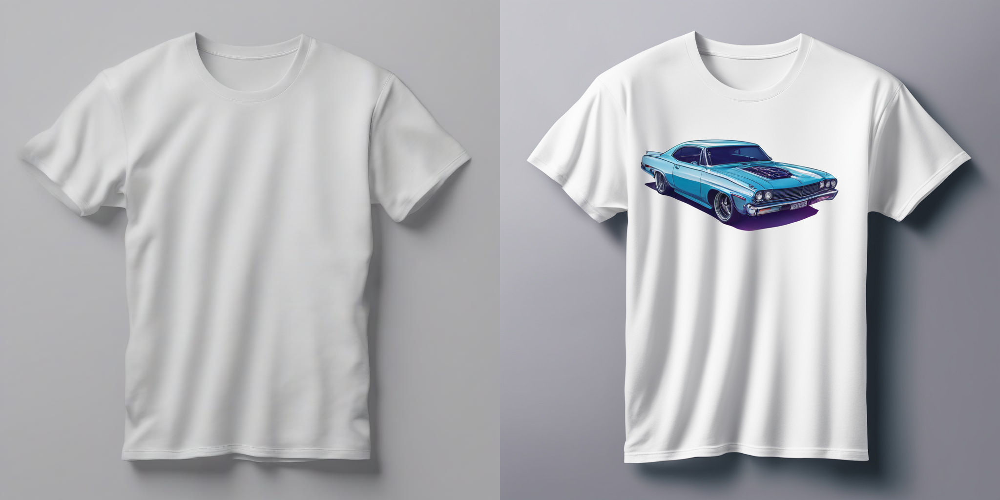

In [50]:
image_grid([Image.open('assets/demo/tshirt.jpg'),res],1,2)

In [51]:
torch.manual_seed(0)
inst = "modify <video> to fit the music  <video> "
mm_data= [
     {"type": "image", }, {"type": "audio",  }
]
mm_data[0]['fname']='assets/demo/tshirt.jpg'
mm_data[1]['fname']=cas
#inst = "modify <video> that captures the essence of <video> "
use_cache = False # will cache llm output
use_cache =0
res0,res,output_caption = pipe(inst,mm_data,alpha = 1.0,h=[0.1*5,0.5,0.5],norm=20.0,refinement=0.2,llm_only=False,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa_v2',subject_strength=0.0,cfg=10,scale=0.0)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.15it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [52]:
print(pipe.cache[2]) 

an image of a white t-shirt on a gray background with a subtle, elegant pattern of violin strings and opera-inspired motifs


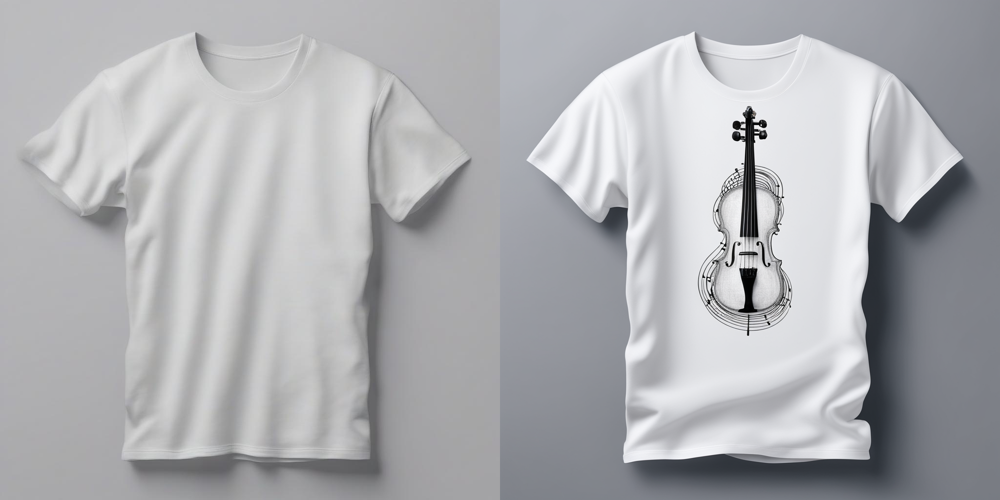

In [53]:
image_grid([Image.open('assets/demo/tshirt.jpg'),res],1,2)

# Multi Modal Image Editing

In [64]:
torch.manual_seed(0)
x = {"inst": "add <video> to <video>",
 "ans": "an image of an antique shop with a clock ticking",
 "mm_data": [
     {"type": "audio", "fname": "assets/demo/clock ticking.wav", }, 
     {"type": "image", "fname": "assets/demo/an antique shop.jpg", }],
}
use_cache = False # will cache llm output
use_cache =0
res0,res,output_caption = pipe(x['inst'],x['mm_data'],alpha = 1.0,h=[0.1*50,0.5,0.5],norm=20.0,refinement=0.2,llm_only=False,num_inference_steps=50,use_cache=use_cache,debug=False,diffusion_mode='ipa_v2',subject_strength=0.0,cfg=5,scale=1.0)
print(pipe.cache[2]) 

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.32it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

an image of a vintage-style clock ticking in the background of an old-fashioned room filled with shelves and jars on the shelves, with a warm and cozy atmosphere


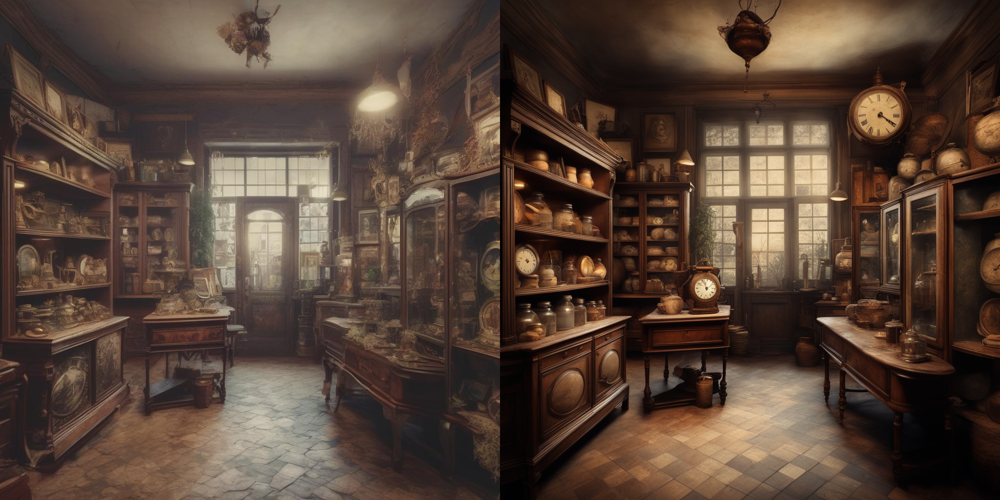

In [65]:
image_grid([Image.open("assets/demo/an antique shop.jpg"),res],1,2)

In [168]:
x =  {
  "inst": "replace <video> with add <video> in <video>",
  "ans": "an image of witch making a potion",
  "mm_data": [
   {
    "type": "image",
    "fname": "assets/demo/an image of a scientist.jpg",
    "is_base": False
   },
          {
    "type": "image",
    "fname": "assets/demo/woman.png",
    "is_base": False
   },
         {
    "type": "image",
    "fname": "assets/demo/an image of scientist experimenting with chemicals.jpg",
    "is_base": False
   },
  ]
 }

In [269]:
torch.manual_seed(0)
use_cache = False # will cache llm output
use_cache =0
res0,res,output_caption = pipe(x['inst'],x['mm_data'],alpha = 1.0,h=[0.1*5,0.5,0.1],norm=20.0,refinement=0.1,llm_only=False,num_inference_steps=50,use_cache=use_cache,debug=1,diffusion_mode='ipa_v2',subject_strength=0.65,cfg=10,scale=1.0)
print(pipe.cache[2]) 
use_cache =1
all_res = [res]
for factor in [10,50]:
    res0,res,output_caption = pipe(x['inst'],x['mm_data'],alpha = 0.8,h=[0.1*factor,0.5,0.1],norm=15.0,refinement=0.1,llm_only=False,num_inference_steps=50,use_cache=use_cache,debug=1,diffusion_mode='ipa_v2',subject_strength=0.65,cfg=10,scale=1.0)
    all_res.append(res)

["<s> A chat between a curious user and an artificial intelligence assistant. The assistant gives helpful, detailed, and polite answers to the user's questions. USER: replace <video>  with add <video>  in <video>  ASSISTANT: Absolutely, its,<base><video><im_gen_start><im_gen>[an image of a woman with red hair and armor holding a beaker]<video>additions:woman with red hair and armor:<video>.</s>"]


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.29it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Subject Embed: torch.Size([1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/32 [00:00<?, ?it/s]

an image of a woman with red hair and armor holding a beaker


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.15it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Subject Embed: torch.Size([1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/32 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:06<00:00,  8.10it/s]

torch.Size([1, 1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Subject Embed: torch.Size([1024])
tensor([[False, False, False,  ..., False, False, False]], device='cuda:0')


  0%|          | 0/32 [00:00<?, ?it/s]

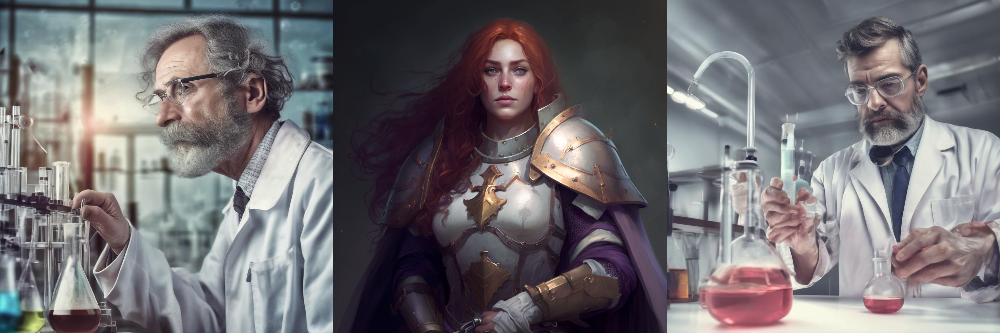

In [271]:
image_grid([Image.open(x['mm_data'][0]['fname']),Image.open(x['mm_data'][1]['fname']),Image.open(x['mm_data'][2]['fname'])],1,3)

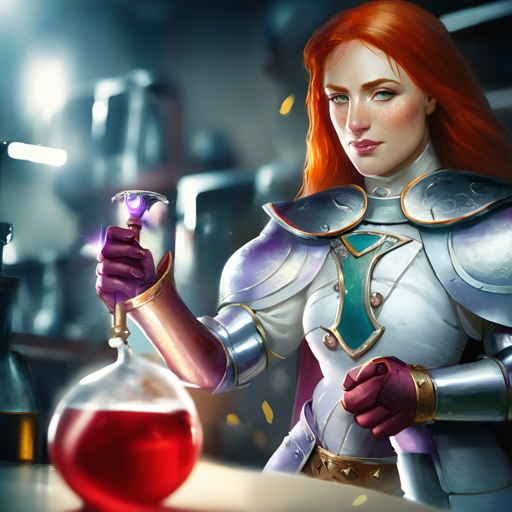

In [282]:
all_res[0].resize((512,512))

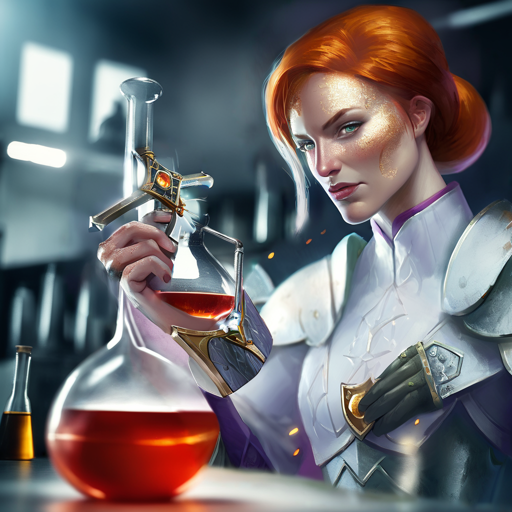

In [283]:
all_res[1].resize((512,512))

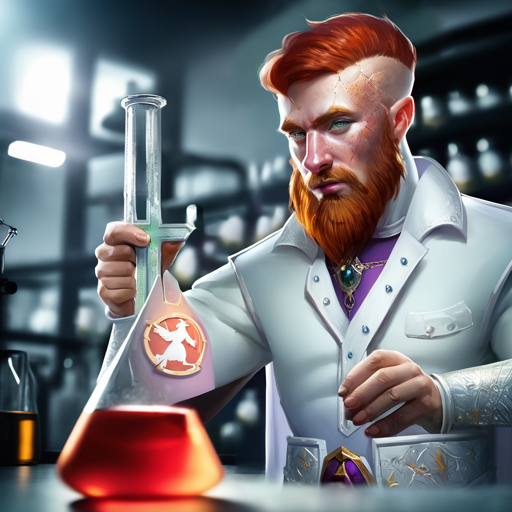

In [284]:
all_res[2].resize((512,512))